In [1]:
import os
import re
import sys
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import skimage
from skimage import io, transform
from sklearn import preprocessing
from tqdm.notebook import tqdm, trange
import anndata as ad
import tifffile
import pickle
from skimage.segmentation import relabel_sequential

In [2]:
p_dir = (Path().cwd().parents[0].parents[0]).absolute()
data_raw = p_dir / "graph"
data_dir = (Path().cwd().parents[0]).absolute() / 'data'

In [3]:
spatial_omics_folder = (Path().cwd().parents[0]).absolute() / 'data' / 'spatial_omics_graph_external'
spatial_omics_folder.mkdir(exist_ok=True, parents=True)


In [4]:
# Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

# import default graph builder parameters
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS

In [5]:
identifier = 'ImageNumber'

status = 'ER.Status'
grade = 'Grade'
stage = 'Stage'

In [6]:
# Generate spatial omics dataframe
data_name = 'Breast_IMC_2'
spatial_path = spatial_omics_folder / f'{data_name}.hdf5'
spadata = SpatialOmics.from_h5py(spatial_path)

In [15]:
spadata.obs['1']

,metabricId,core_id,ImageNumber,ObjectNumber,Location_Center_X,Location_Center_Y,SOM_nodes,pg_cluster,description,meta_id,y,x
1,MB-0901,1,1,1,49.00000,1.052632,71,16,HER2+,5,1.052632,49.000000
2,MB-0901,1,1,2,345.00000,3.923077,37,18,HR- CKlow CK5+,11,3.923077,345.000000
3,MB-0901,1,1,3,29.50000,5.000000,18,8,Fibroblasts CD68+,4,5.000000,29.500000
4,MB-0901,1,1,4,291.19232,4.884615,15,47,Macrophages Vim+ CD45low,15,4.884615,291.192308
5,MB-0901,1,1,5,261.25372,4.298508,122,19,Macrophages Vim+ Slug+,16,4.298507,261.253731
...,...,...,...,...,...,...,...,...,...,...,...,...
1661,MB-0901,1,1,1661,383.96490,502.807010,1,13,Macrophages Vim+ Slug-,17,502.807018,383.964912
1662,MB-0901,1,1,1662,304.67499,502.725010,15,47,Macrophages Vim+ CD45low,15,502.725000,304.675000
1663,MB-0901,1,1,1663,404.26251,501.799990,30,23,Myoepithelial,18,501.800000,404.262500
1664,MB-0901,1,1,1664,464.86957,502.521730,2,13,Macrophages Vim+ Slug-,17,502.521739,464.869565


In [9]:
spadata.X['1'].columns

Index(['HH3_total', 'CK19', 'CK8_18', 'Twist', 'CD68', 'CK14', 'SMA',
       'Vimentin', 'c_Myc', 'HER2', 'CD3', 'HH3_ph', 'Erk1_2', 'Slug', 'ER',
       'PR', 'p53', 'CD44', 'EpCAM', 'CD45', 'GATA3', 'CD20', 'Beta_catenin',
       'CAIX', 'E_cadherin', 'Ki67', 'EGFR', 'pS6', 'Sox9', 'vWF_CD31',
       'pmTOR', 'CK7', 'panCK', 'c_PARP_c_Casp3', 'DNA1', 'DNA2', 'H3K27me3',
       'CK5', 'Fibronectin'],
      dtype='object')

In [ ]:
import matplotlib 
from matplotlib.colors import ListedColormap, Normalize

save_path = (Path().cwd().parents[0]).absolute() / 'data' / 'adata' / 'breast.h5ad'
adata = sc.read_h5ad(save_path)

# Extract colormap
var = 'description'

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

# Create cmap for spatial omics data
cmap_labels = {i:l for i,l in enumerate(labels)}
label_cmap = {l:i for i,l in enumerate(labels)}
cmap = np.array([colors_rgb_dict[l] for l in labels])
adata.obs['meta_id'] = adata.obs[var].apply(lambda x: label_cmap.get(x,x))
adata.obs

c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


,metabricId,core_id,ImageNumber,ObjectNumber,Location_Center_X,Location_Center_Y,SOM_nodes,pg_cluster,description,meta_id
0,MB-0000,1,527,1,161.83333,6.000000,6,24,Fibroblasts,3
1,MB-0000,1,527,2,177.30435,15.539130,6,24,Fibroblasts,3
2,MB-0000,1,527,3,293.51898,19.886076,6,24,Fibroblasts,3
3,MB-0000,1,527,4,165.04347,22.210144,4,20,Fibroblasts CD68+,4
4,MB-0000,1,527,5,108.88095,28.523809,6,24,Fibroblasts,3
...,...,...,...,...,...,...,...,...,...,...
479839,MB-0921,1,381,2080,440.20001,582.400020,99,54,HR- CK7-,10
479840,MB-0921,1,381,2081,447.57895,583.157900,83,28,HRlow CKlow,13
479841,MB-0921,1,381,2082,403.16666,583.142880,67,45,HRlow CKlow,13
479842,MB-0921,1,381,2083,308.53845,585.230770,20,21,Fibroblasts,3


In [50]:
# Get epithelial phenotype list
pheno = list(adata.obs.description.unique())
epi_list = [p for p in pheno if 'HR' in p or 'Basal' in p or 'HER' in p]
map_dict = dict(zip(epi_list, [1 for i in range(len(epi_list))]))

# Create new mapping in adata
adata.obs['type'] = adata.obs['description'].apply(lambda x: map_dict.get(x, 0))

In [51]:
adata.obs['type'].unique()

array([0, 1], dtype=int64)

In [45]:
# Add colormap to spatial omics data
spadata.uns['cmaps'].update({'meta_id': ListedColormap(cmap / 255)})
spadata.uns['cmap_labels'].update({'meta_id': cmap_labels})


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


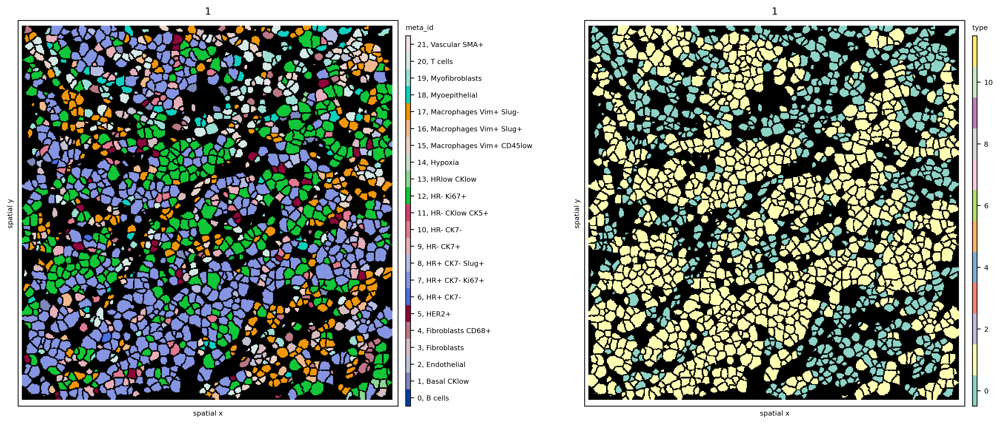

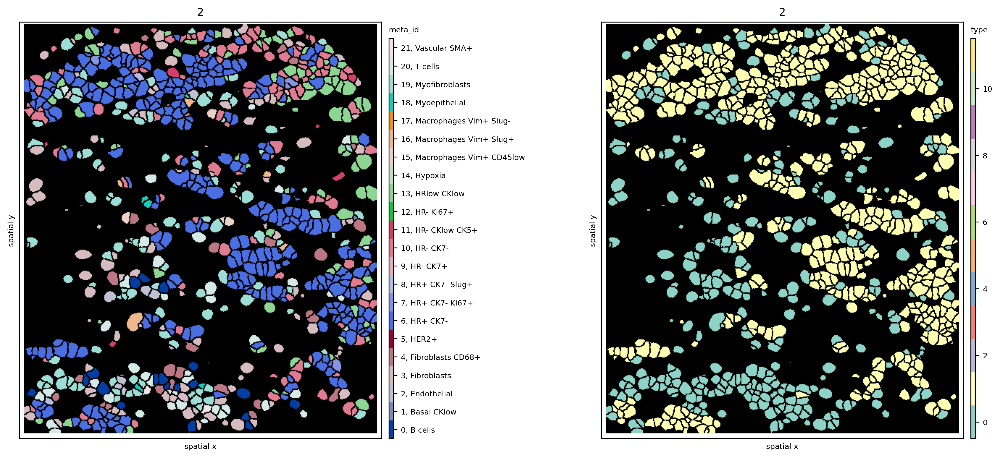

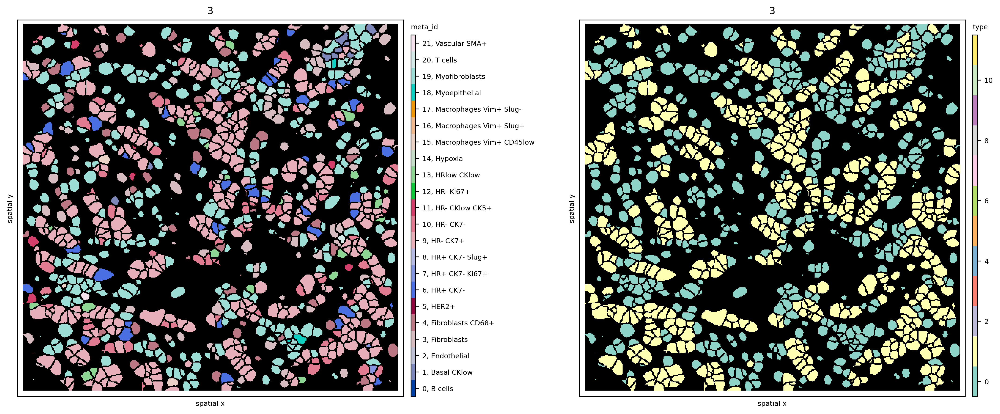

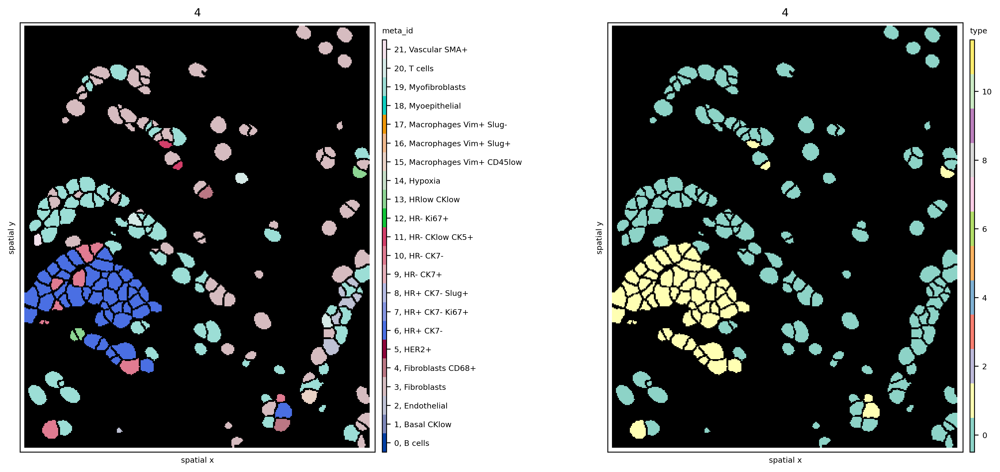

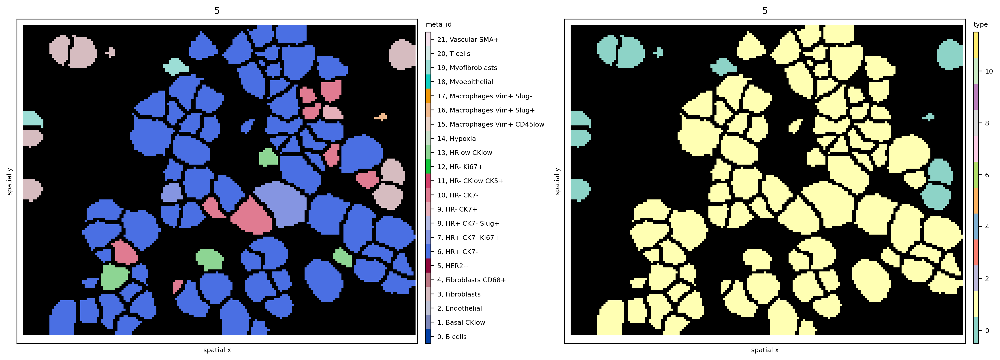

...

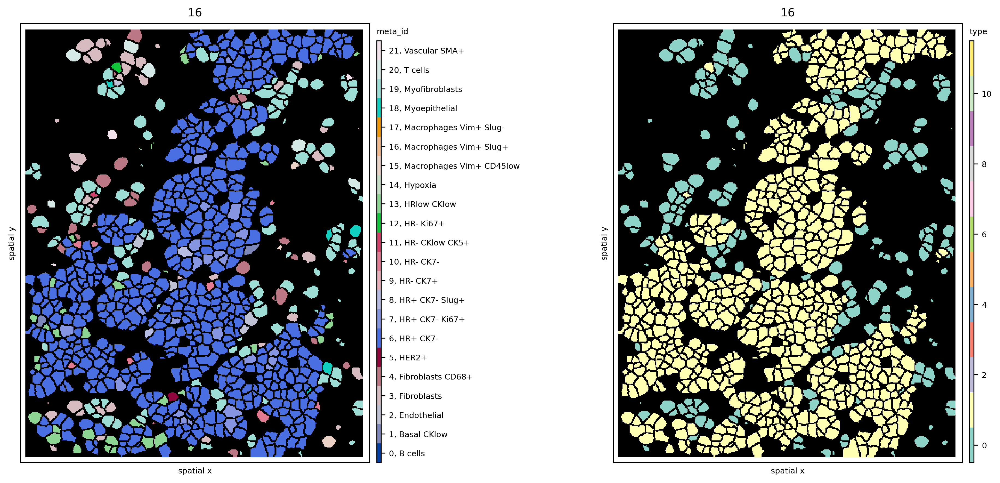

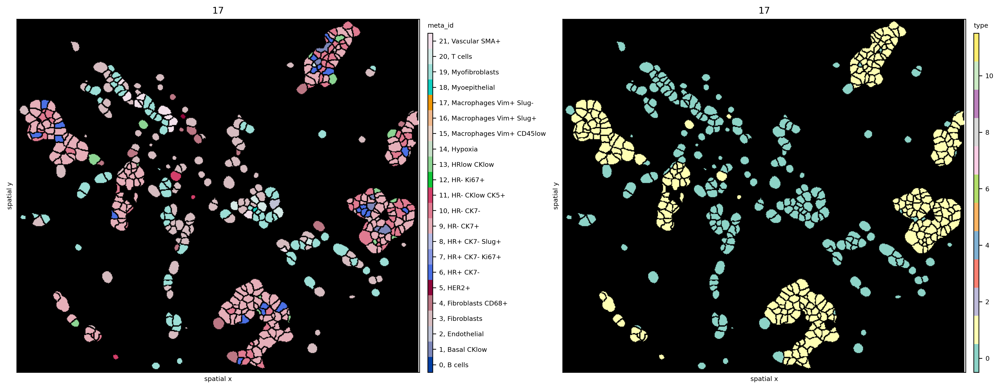

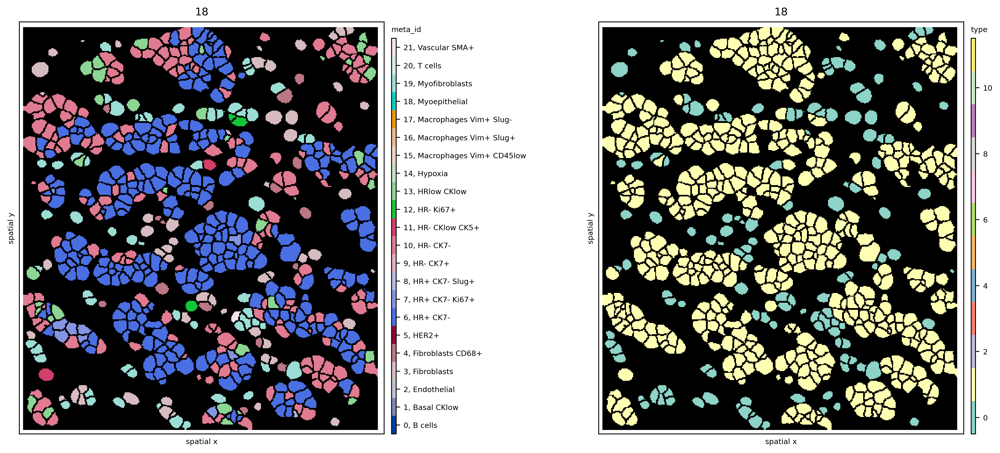

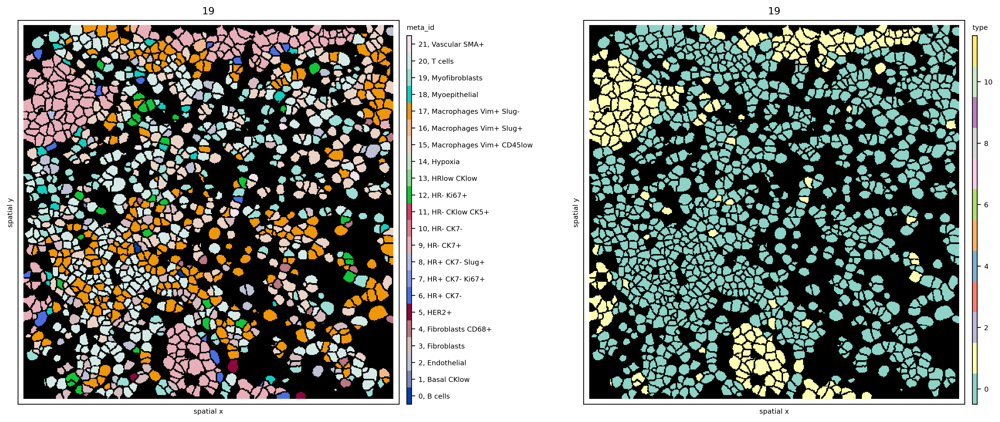

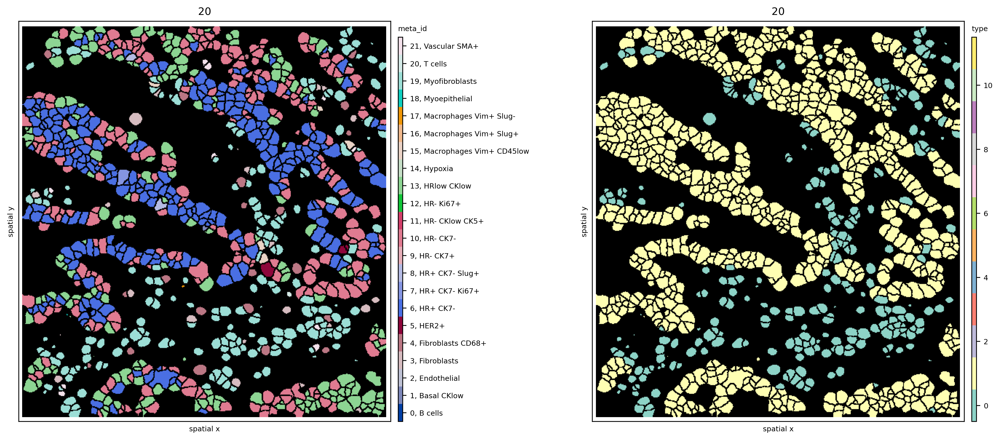

In [55]:
for im_id in spadata.spl[identifier].unique()[:20]:
    im_id = str(im_id)
    print(im_id)
    spadata.obs[str(im_id)]['type'] = spadata.obs[str(im_id)]['description'].apply(lambda x: map_dict.get(x, 0))
    spadata.obs[str(im_id)]['type'] = spadata.obs[str(im_id)]['type'].astype('category')
    # im_id = str(im_id)
    fig, axs = plt.subplots(1, 2, figsize=(15, 6), dpi=300)
    ath.pl.spatial(spadata, im_id, 'meta_id', mode='mask', ax=axs.flat[0],background_color='black')
    ath.pl.spatial(spadata, im_id, 'type', mode='mask', ax=axs.flat[1], background_color='black')
